# Image Similarity Measurement Using Various Algorithm For Feature Detection And Matching

In this notebook, I have compared various algorithms for matching image similarity based on feature detection and matching algorithms. This study was done to compare the compute time of various algorithms in absence of GPUs mainly for edge devices such as VOXL2 which I am using. The images used in this notebook have been captured from a ModalAI UAV having a VOXL2 companion compute running ROS2 foxy. The images were captued at Brin Family Aerial Robotics Lab at the University of Maryland, College Park.

In [ ]:
import torch
import torchvision.transforms as T
import timm
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
import time

# DINOv2

DINOv2 models produce high-performance visual features that can be directly employed with classifiers as simple as linear layers on a variety of computer vision tasks; these visual features are robust and perform well across domains without any requirement for fine-tuning. The models were pretrained on a dataset of 142 M images without using any labels or annotations.

More information can be found at

https://ai.meta.com/blog/dino-v2-computer-vision-self-supervised-learning/

In [ ]:
# Load DINOv2
device = 'cpu'
model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14').to(device)
model.eval()

Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 1536, kernel_size=(14, 14), stride=(14, 14))
    (norm): Identity()
  )
  (blocks): ModuleList(
    (0-39): 40 x NestedTensorBlock(
      (norm1): LayerNorm((1536,), eps=1e-06, elementwise_affine=True)
      (attn): MemEffAttention(
        (qkv): Linear(in_features=1536, out_features=4608, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=1536, out_features=1536, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (drop_path1): Identity()
      (norm2): LayerNorm((1536,), eps=1e-06, elementwise_affine=True)
      (mlp): SwiGLUFFNFused(
        (w12): Linear(in_features=1536, out_features=8192, bias=True)
        (w3): Linear(in_features=4096, out_features=1536, bias=True)
      )
      (ls2): LayerScale()
      (drop_path2): Identity()
    )
  )
  (norm): LayerNorm((1536,), eps=1e-06, elementwise_affine=True)
  (head

In [ ]:
# Preprocessing function
transform = T.Compose([
    T.ToPILImage(),
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.5], std=[0.5])
])

Time taken: 26.265109062194824 seconds


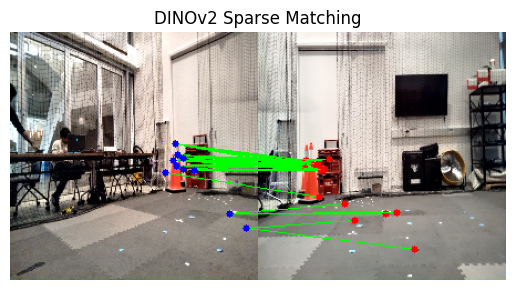

In [ ]:
from math import e
def extract_features(img):
    """Extract dense patch features from image using DINOv2."""
    img_tensor = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model.forward_features(img_tensor)
        if isinstance(output, dict):
            feats = output['x_norm_patchtokens']  # [1, 196, C]
        else:
            raise ValueError("Unexpected model output type")

    B, N, C = feats.shape
    H = W = int(N ** 0.5)  # e.g., 14x14

    feats = feats.reshape(B, H, W, C).squeeze(0).cpu().numpy()  # [H, W, C]
    return feats.reshape(-1, C), H, W


def get_sparse_keypoints(img, max_kps=300):
    """Use SIFT to get keypoints."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create(nfeatures=max_kps)
    kps = sift.detect(gray, None)
    kps = sorted(kps, key=lambda x: -x.response)[:max_kps]
    return [(int(k.pt[0]), int(k.pt[1])) for k in kps]


def match_features(desc1, desc2, top_k=50):
    """Match features using cosine similarity and return top-k matches."""
    sim = cosine_similarity(desc1, desc2)  # shape: [N1, N2]
    pairs = []
    for i in range(sim.shape[0]):
        for j in range(sim.shape[1]):
            pairs.append((i, j, sim[i, j]))
    # Sort by similarity and take top_k matches
    pairs = sorted(pairs, key=lambda x: -x[2])[:top_k]
    return [(i, j) for i, j, _ in pairs]


def draw_matches(img1, img2, kps1, kps2, matches):
    h1, w1 = img1.shape[:2]
    canvas = np.hstack([img1, img2])
    for i, j in matches:
        pt1 = kps1[i]
        pt2 = (kps2[j][0] + w1, kps2[j][1])
        cv2.line(canvas, pt1, pt2, (0, 255, 0), 1)
        cv2.circle(canvas, pt1, 3, (255, 0, 0), -1)
        cv2.circle(canvas, pt2, 3, (0, 0, 255), -1)
    return canvas


# Load images
img1 = cv2.imread('image_3.jpg')
img2 = cv2.imread('image_4.jpg')

start_time = time.time()

# Resize for consistency
img1 = cv2.resize(img1, (224, 224))
img2 = cv2.resize(img2, (224, 224))

# Extract dense features
feats1, H1, W1 = extract_features(img1)
feats2, H2, W2 = extract_features(img2)

# Get sparse keypoints
kps1 = get_sparse_keypoints(img1)
kps2 = get_sparse_keypoints(img2)

# Get descriptors at sparse keypoints
def get_patch_descriptors(kps, feats, H, W):
    descs = []
    for x, y in kps:
        ix = int((y / 224) * H)
        iy = int((x / 224) * W)
        idx = ix * W + iy
        descs.append(feats[idx])
    return np.array(descs)

desc1 = get_patch_descriptors(kps1, feats1, H1, W1)
desc2 = get_patch_descriptors(kps2, feats2, H2, W2)

# Match
# matches = match_features(desc1, desc2)
matches = match_features(desc1, desc2, top_k=50)


end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken: {elapsed_time} seconds")

# Draw
matched_img = draw_matches(img1, img2, kps1, kps2, matches)
# plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('DINOv2 Sparse Matching')
plt.show()

# CLIP

CLIP (Contrastive Language–Image Pretraining), developed by OpenAI, is primarily designed to align visual and textual representations. However, its image encoder can also be leveraged for feature matching between images in computer vision tasks such as image retrieval, sparse correspondence, and localization.

https://openai.com/index/clip/

In [ ]:
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-xxgtq_nq
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-xxgtq_nq
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [ ]:
import clip

device = "cpu"

# Load CLIP model
model, preprocess = clip.load("ViT-B/32", device=device)

Time taken: 144.99124908447266 seconds
Number of matches: 50


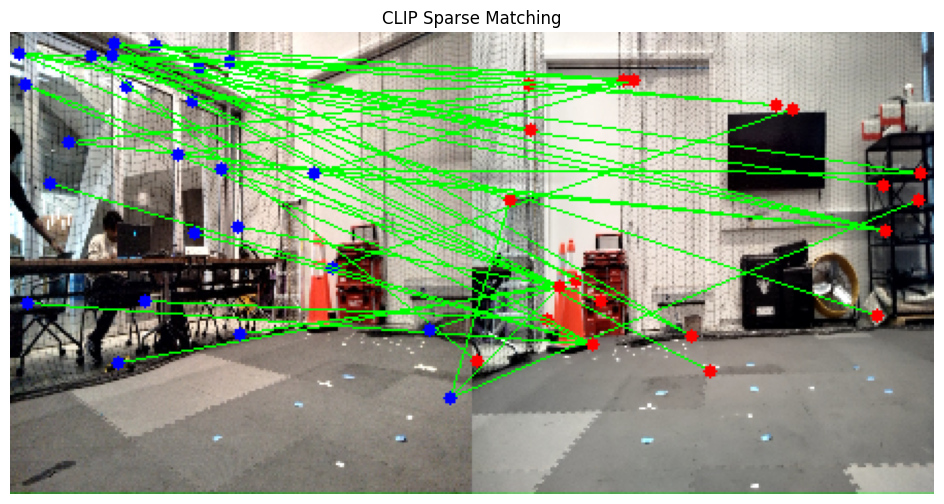

In [ ]:
def get_sparse_keypoints(img, max_kps=300):
    """Use SIFT to get keypoints."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create(nfeatures=max_kps)
    kps = sift.detect(gray, None)
    kps = sorted(kps, key=lambda x: -x.response)[:max_kps]
    return [(int(k.pt[0]), int(k.pt[1])) for k in kps]

def crop_and_embed_patches(img, keypoints, patch_size=32):
    """Extract square patches centered on keypoints and embed using CLIP."""
    descriptors = []
    for x, y in keypoints:
        x1 = max(0, x - patch_size // 2)
        y1 = max(0, y - patch_size // 2)
        x2 = min(img.shape[1], x + patch_size // 2)
        y2 = min(img.shape[0], y + patch_size // 2)
        patch = img[y1:y2, x1:x2]

        # Skip if patch is not square
        if patch.shape[0] != patch_size or patch.shape[1] != patch_size:
            continue

        # Preprocess and embed
        patch_pil = cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)
        patch_tensor = preprocess(Image.fromarray(patch_pil)).unsqueeze(0).to(device)
        with torch.no_grad():
            desc = model.encode_image(patch_tensor).cpu().numpy()
        descriptors.append(desc[0])

    return np.array(descriptors)


from PIL import Image

# Load and resize images (CLIP expects ~224x224 inputs)
img1 = cv2.imread("image_3.jpg")
img2 = cv2.imread("image_4.jpg")

start_time = time.time()

img1 = cv2.resize(img1, (224, 224))
img2 = cv2.resize(img2, (224, 224))

# Get keypoints
kps1 = get_sparse_keypoints(img1)
kps2 = get_sparse_keypoints(img2)

# Embed patch descriptors with CLIP
desc1 = crop_and_embed_patches(img1, kps1)
desc2 = crop_and_embed_patches(img2, kps2)

# Match descriptors
matches = match_features(desc1, desc2, top_k=50)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken: {elapsed_time} seconds")
print(f"Number of matches: {len(matches)}")

# Draw
matched_img = draw_matches(img1, img2, kps1, kps2, matches)
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("CLIP Sparse Matching")
plt.show()

# ORB

ORB is a fast, efficient, and open-source feature detector and descriptor designed for real-time applications. It’s a combination of two existing techniques: FAST for keypoint detection and BRIEF for descriptor extraction, with enhancements for orientation and scale

Time taken: 0.15905070304870605 seconds
Number of matches: 267
Total number of matches: 267
Number of good matches: 80


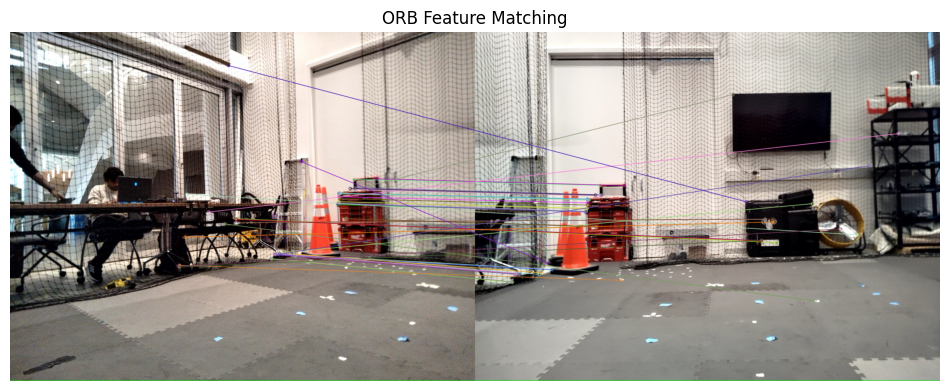

In [ ]:
# Load images
img1 = cv2.imread("image_3.jpg", cv2.IMREAD_COLOR)
img2 = cv2.imread("image_4.jpg", cv2.IMREAD_COLOR)

if img1 is None or img2 is None:
    raise FileNotFoundError("One or both image files could not be loaded. Check the paths.")

start_time = time.time()

# Initialize ORB detector
orb = cv2.ORB_create(nfeatures=1000)

# Detect keypoints and compute descriptors
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Create brute-force matcher with Hamming distance
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Time taken: {elapsed_time} seconds")

print(f"Number of matches: {len(matches)}")

# Define a distance threshold for "good" matches
GOOD_MATCH_THRESHOLD = 50
good_matches = [m for m in matches if m.distance < GOOD_MATCH_THRESHOLD]

# Take the average number of keypoints in both images
avg_keypoints = (len(kp1) + len(kp2)) / 2

print(f"Total number of matches: {len(matches)}")
print(f"Number of good matches: {len(good_matches)}")

# Draw top 50 matches (or all if less than 50)
top_n = min(50, len(matches))
matched_img = cv2.drawMatches(img1, kp1, img2, kp2, matches[:top_n], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Show result
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f'ORB Feature Matching')
plt.show()

In [ ]:
!pip install kornia torch torchvision matplotlib opencv-python

In [ ]:
from pathlib import Path

if Path.cwd().name != "LightGlue":
    !git clone --quiet https://github.com/cvg/LightGlue/
    %cd LightGlue
    !pip install --progress-bar off --quiet -e .

from lightglue import LightGlue, SuperPoint, DISK, ALIKED, SIFT
from lightglue.utils import load_image, rbd
from lightglue import viz2d

device = "cpu"

fatal: destination path 'LightGlue' already exists and is not an empty directory.
/content/LightGlue
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for lightglue (pyproject.toml) ... done


/content/LightGlue/lightglue/lightglue.py:24: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @torch.cuda.amp.custom_fwd(cast_inputs=torch.float32)


# LIGHTGLUE

LightGlue is a modern learned feature matcher that builds on ideas from SuperGlue but is faster and more modular. It performs context-aware matching by taking features (keypoints + descriptors) from any detector and refining matches using attention mechanisms.

Key traits:

*   Works with any keypoint detector
*   Leverages transformer-based cross-attention
*   Returns reliable matches even in textureless or repetitive scenes
*   Offers a fast mode and a stronger “lightglue-fast” variant

## Superpoint + LightGlue

* SuperPoint provides learned keypoints and dense descriptors.
* Combined with LightGlue, it offers strong all-around performance for indoor and outdoor scenes.
* Works well in low-texture environments or wide-baseline matching


In [ ]:
extractor = SuperPoint(max_num_keypoints=1024)
matcher = LightGlue(features='superpoint', depth_confidence=0.9, width_confidence=0.95)

Time taken: 23.390166521072388 seconds


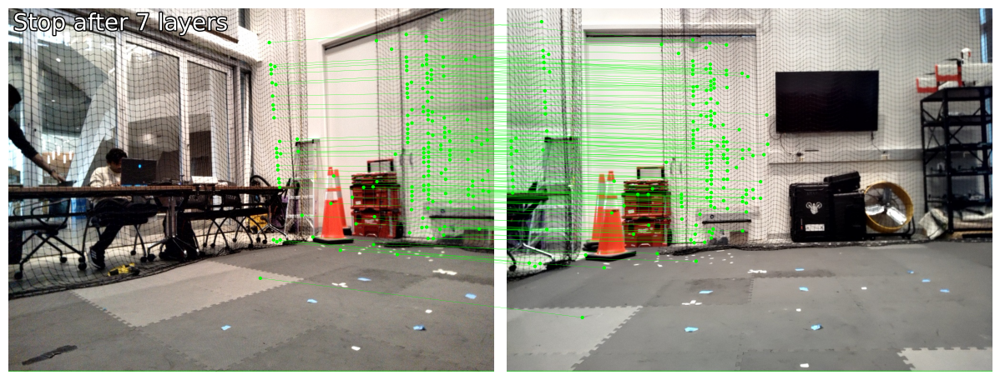

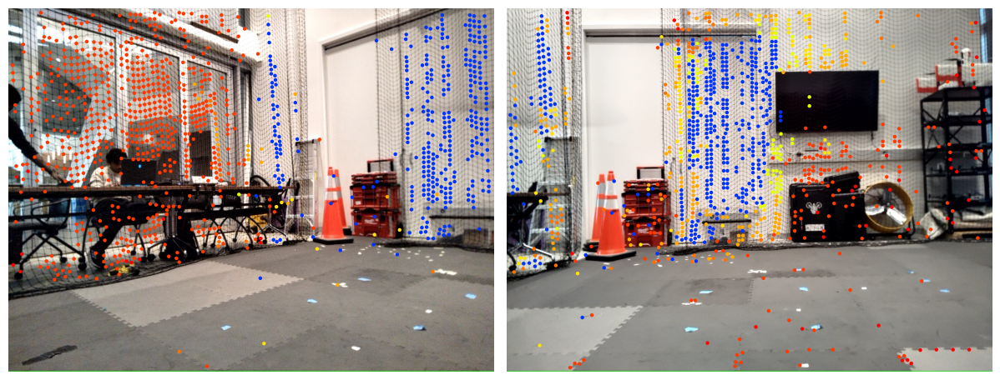

In [ ]:
start_time = time.time()

img1 = load_image("image_3.jpg")
img2 = load_image("image_4.jpg")

feats0 = extractor.extract(img1.to(device))
feats1 = extractor.extract(img2.to(device))
matches01 = matcher({"image0": feats0, "image1": feats1})
feats0, feats1, matches01 = [
    rbd(x) for x in [feats0, feats1, matches01]
]  # remove batch dimension

kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

stop_time = time.time()
elapsed_time = stop_time - start_time
print(f"Time taken: {elapsed_time} seconds")

axes = viz2d.plot_images([img1, img2])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'Stop after {matches01["stop"]} layers', fs=20)

kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])

viz2d.plot_images([img1, img2])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)

## DISK + LIGHTGLUE

* DISK uses reinforcement learning to train both keypoint detector and descriptor jointly.

* When paired with LightGlue, it gives robust, repeatable matches, especially in dynamic environments.

* Suitable for visual SLAM or scenes with large viewpoint changes.

In [ ]:
extractor = DISK(max_num_keypoints=1024).eval()  # load the extractor
matcher = LightGlue(features='disk', depth_confidence=0.9, width_confidence=0.95).eval()  # load the matche

Time taken: 28.752707719802856 seconds


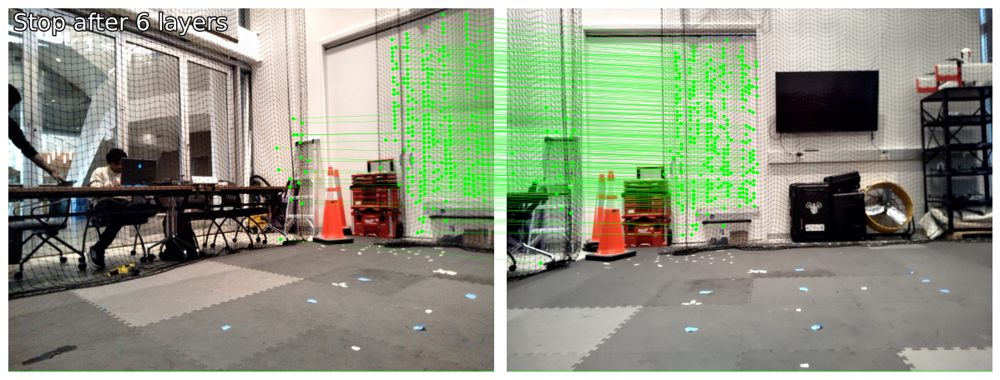

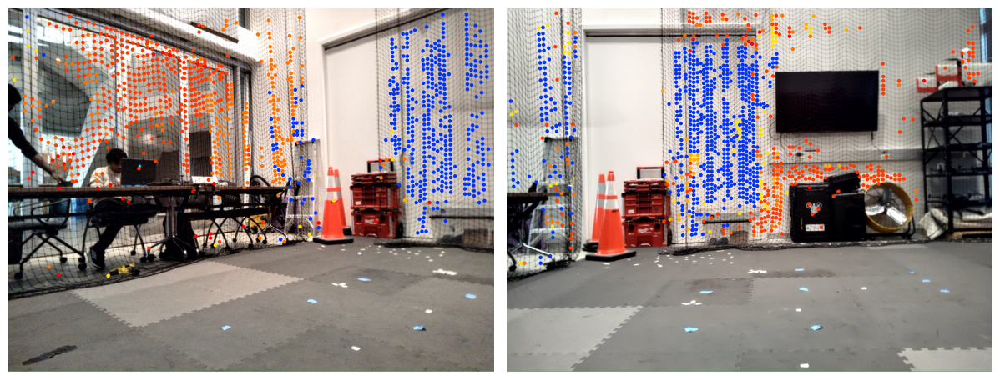

In [ ]:
start_time = time.time()

img1 = load_image("image_3.jpg")
img2 = load_image("image_4.jpg")

feats0 = extractor.extract(img1.to(device))
feats1 = extractor.extract(img2.to(device))
matches01 = matcher({"image0": feats0, "image1": feats1})
feats0, feats1, matches01 = [
    rbd(x) for x in [feats0, feats1, matches01]
]  # remove batch dimension

kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

stop_time = time.time()
elapsed_time = stop_time - start_time
print(f"Time taken: {elapsed_time} seconds")

axes = viz2d.plot_images([img1, img2])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'Stop after {matches01["stop"]} layers', fs=20)

kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])

viz2d.plot_images([img1, img2])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)

## ALIKED + LIGHTGLUE

* ALIKED (Attention-based Learned Invariant Keypoint Detector) is a lightweight, high-performance detector and descriptor.

* The combo is fast and efficient, ideal for real-time applications on mobile/embedded devices.

* Great for low-power SLAM or robotics.

In [ ]:
extractor = ALIKED(max_num_keypoints=1024).eval()  # load the extractor
matcher = LightGlue(features='aliked', depth_confidence=0.9, width_confidence=0.95).eval()  # load the matche

Time taken: 9.60352611541748 seconds


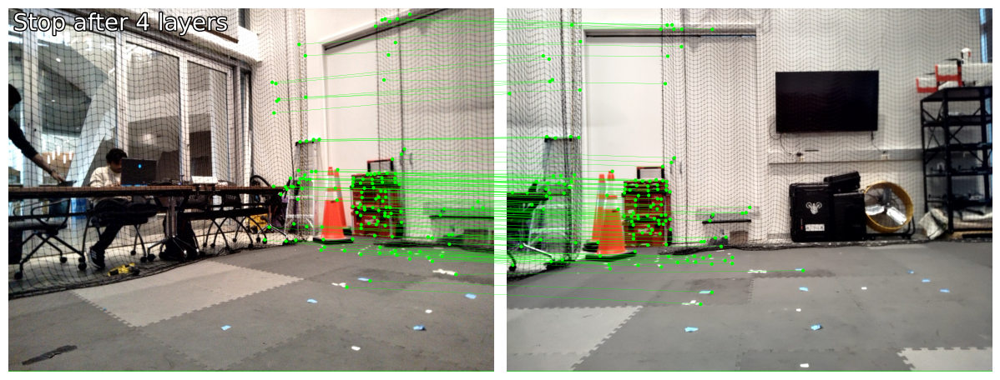

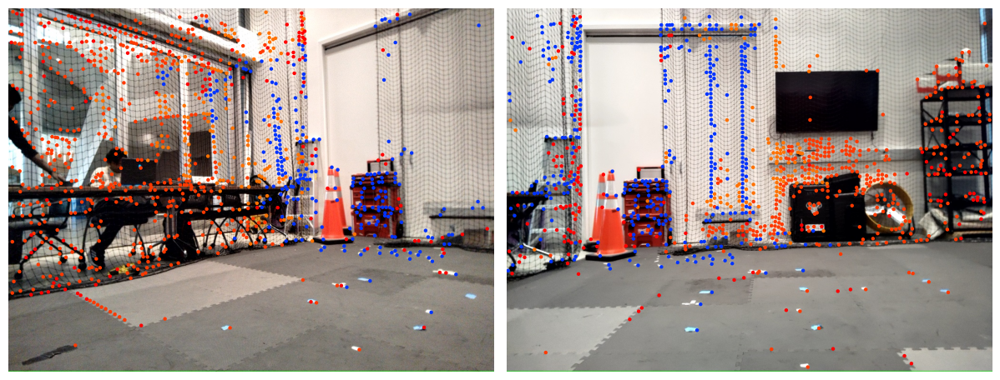

In [ ]:
start_time = time.time()

img1 = load_image("image_3.jpg")
img2 = load_image("image_4.jpg")

feats0 = extractor.extract(img1.to(device))
feats1 = extractor.extract(img2.to(device))
matches01 = matcher({"image0": feats0, "image1": feats1})
feats0, feats1, matches01 = [
    rbd(x) for x in [feats0, feats1, matches01]
]  # remove batch dimension

kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

stop_time = time.time()
elapsed_time = stop_time - start_time
print(f"Time taken: {elapsed_time} seconds")

axes = viz2d.plot_images([img1, img2])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'Stop after {matches01["stop"]} layers', fs=20)

kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])

viz2d.plot_images([img1, img2])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)

## SIFT + LIGHTGLUE

* SIFT is a classical keypoint detector + descriptor.

* Using LightGlue on top of SIFT enhances match consistency, especially in cluttered scenes.

* This hybrid setup combines SIFT's scale invariance with LightGlue's contextual filtering.

In [ ]:
extractor = SIFT(max_num_keypoints=512).eval()  # load the extractor
matcher = LightGlue(features='sift', depth_confidence=0.75, width_confidence=0.9).eval()  # load the matche

Time taken: 1.074873924255371 seconds
Number of matches: 58
Number of keypoints in image 1: 390
Number of keypoints in image 2: 386


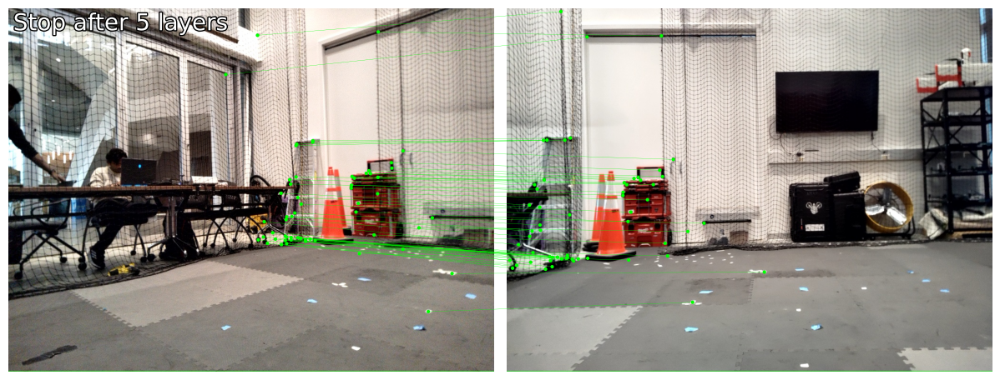

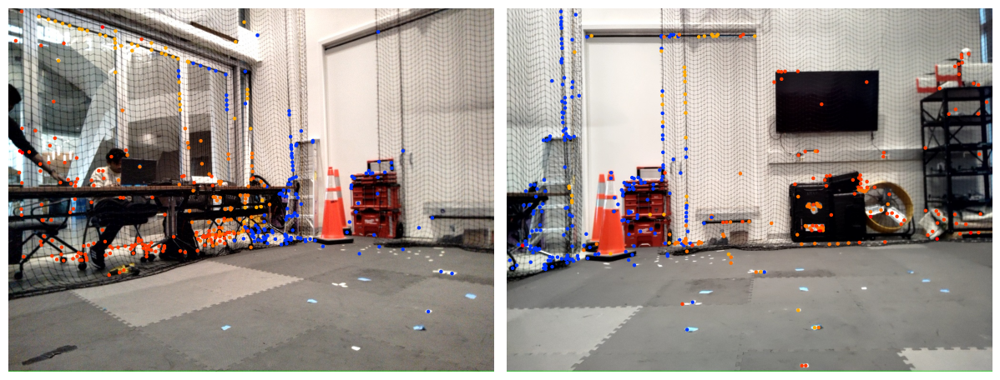

In [ ]:
start_time = time.time()

img1 = load_image("image_3.jpg")
img2 = load_image("image_4.jpg")

feats0 = extractor.extract(img1.to(device))
feats1 = extractor.extract(img2.to(device))
matches01 = matcher({"image0": feats0, "image1": feats1})
feats0, feats1, matches01 = [
    rbd(x) for x in [feats0, feats1, matches01]
]  # remove batch dimension

kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

stop_time = time.time()
elapsed_time = stop_time - start_time
print(f"Time taken: {elapsed_time} seconds")

print(f"Number of matches: {len(matches)}")
print(f"Number of keypoints in image 1: {len(kpts0)}")
print(f"Number of keypoints in image 2: {len(kpts1)}")

axes = viz2d.plot_images([img1, img2])
viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)
viz2d.add_text(0, f'Stop after {matches01["stop"]} layers', fs=20)

kpc0, kpc1 = viz2d.cm_prune(matches01["prune0"]), viz2d.cm_prune(matches01["prune1"])

viz2d.plot_images([img1, img2])
viz2d.plot_keypoints([kpts0, kpts1], colors=[kpc0, kpc1], ps=10)

In [ ]:
%%capture
!pip install kornia
!pip install kornia-rs
!pip install kornia_moons --no-deps
!pip install opencv-python --upgrade

In [ ]:
import io
import requests

import kornia as K
import kornia.feature as KF
from kornia.feature.adalam import AdalamFilter
from kornia_moons.viz import *

device = K.utils.get_cuda_or_mps_device_if_available()
print(device)

cpu


## DISK + ADALAM

This pipeline combines DISK, a learned keypoint detector and descriptor, with AdaLAM, a lightweight and geometry-aware feature matcher. It’s ideal for high-performance, real-time applications that require robustness and speed.

In [ ]:
# %%capture
fname1 = "image_3.jpg"
fname2 = "image_4.jpg"

adalam_config = KF.adalam.get_adalam_default_config()
# adalam_config['orientation_difference_threshold'] = None
# adalam_config['scale_rate_threshold'] = None
adalam_config["force_seed_mnn"] = False
adalam_config["search_expansion"] = 16
adalam_config["ransac_iters"] = 256

start_time = time.time()
img1 = K.io.load_image(fname1, K.io.ImageLoadType.RGB32, device=device)[None, ...]
img2 = K.io.load_image(fname2, K.io.ImageLoadType.RGB32, device=device)[None, ...]

num_features = 1024
disk = KF.DISK.from_pretrained("depth").to(device)

hw1 = torch.tensor(img1.shape[2:], device=device)
hw2 = torch.tensor(img2.shape[2:], device=device)

match_with_adalam = True

with torch.inference_mode():
    inp = torch.cat([img1, img2], dim=0)
    features1, features2 = disk(inp, num_features, pad_if_not_divisible=True)
    kps1, descs1 = features1.keypoints, features1.descriptors
    kps2, descs2 = features2.keypoints, features2.descriptors
    if match_with_adalam:
        lafs1 = KF.laf_from_center_scale_ori(kps1[None], 96 * torch.ones(1, len(kps1), 1, 1, device=device))
        lafs2 = KF.laf_from_center_scale_ori(kps2[None], 96 * torch.ones(1, len(kps2), 1, 1, device=device))

        dists, idxs = KF.match_adalam(descs1, descs2, lafs1, lafs2, hw1=hw1, hw2=hw2, config=adalam_config)
    else:
        dists, idxs = KF.match_smnn(descs1, descs2, 0.98)


print(f"{idxs.shape[0]} tentative matches with DISK AdaLAM")

97 tentative matches with DISK AdaLAM


In [ ]:
def get_matching_keypoints(kp1, kp2, idxs):
    mkpts1 = kp1[idxs[:, 0]]
    mkpts2 = kp2[idxs[:, 1]]
    return mkpts1, mkpts2


mkpts1, mkpts2 = get_matching_keypoints(kps1, kps2, idxs)

Fm, inliers = cv2.findFundamentalMat(
    mkpts1.detach().cpu().numpy(), mkpts2.detach().cpu().numpy(), cv2.USAC_MAGSAC, 1.0, 0.999, 100000
)
inliers = inliers > 0
print(f"{inliers.sum()} inliers with DISK")

stop_time = time.time()
elapsed_time = stop_time - start_time
print(f"Time taken: {elapsed_time} seconds")

55 inliers with DISK
Time taken: 38.90405035018921 seconds


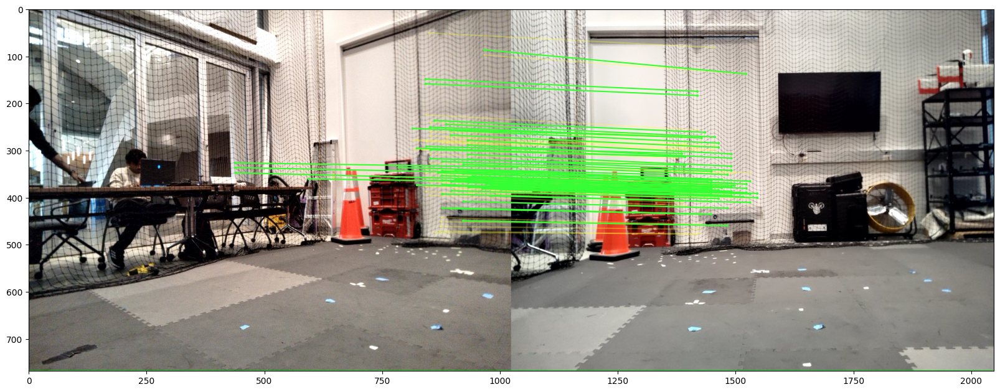

In [ ]:
draw_LAF_matches(
    KF.laf_from_center_scale_ori(kps1[None].cpu()),
    KF.laf_from_center_scale_ori(kps2[None].cpu()),
    idxs.cpu(),
    K.tensor_to_image(img1.cpu()),
    K.tensor_to_image(img2.cpu()),
    inliers,
    draw_dict={"inlier_color": (0.2, 1, 0.2), "tentative_color": (1, 1, 0.2, 0.3), "feature_color": None, "vertical": False},
)

## LoFTR

This pipeline uses LoFTR (Detector-Free Local Feature Matching with Transformers), a deep-learning-based matcher that directly predicts correspondences between two images without relying on explicit keypoint detection. It excels in low-texture or wide-baseline scenarios where traditional keypoint-based methods fail.

In [ ]:
import cv2
import kornia as K
import kornia.feature as KF
import matplotlib.pyplot as plt
import numpy as np
import torch
from kornia_moons.viz import draw_LAF_matches

Time taken: 0.0037145614624023438 seconds


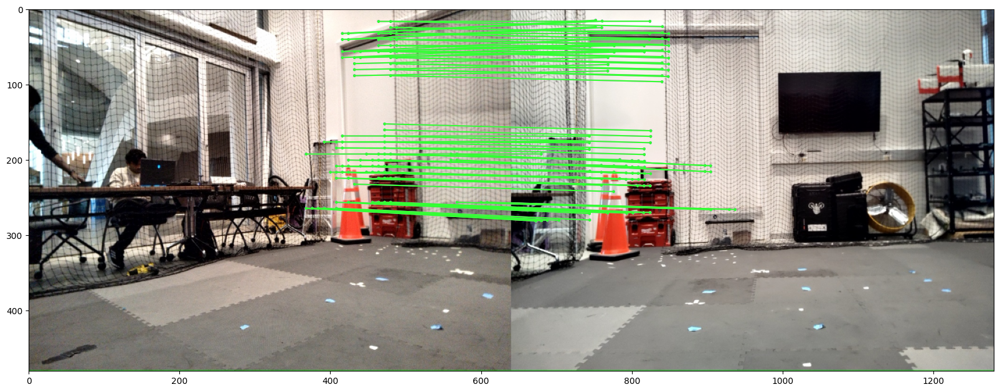

In [ ]:
fname1 = "image_3.jpg"
fname2 = "image_4.jpg"

img1 = K.io.load_image(fname1, K.io.ImageLoadType.RGB32)[None, ...]
img2 = K.io.load_image(fname2, K.io.ImageLoadType.RGB32)[None, ...]

img1 = K.geometry.resize(img1, (480, 640), antialias=True)
img2 = K.geometry.resize(img2, (480, 640), antialias=True)

matcher = KF.LoFTR(pretrained="indoor_new")
start_time = time.time()

input_dict = {
    "image0": K.color.rgb_to_grayscale(img1),  # LofTR works on grayscale images only
    "image1": K.color.rgb_to_grayscale(img2),
}

with torch.inference_mode():
    correspondences = matcher(input_dict)

start_time = time.time()
mkpts0 = correspondences["keypoints0"].cpu().numpy()
mkpts1 = correspondences["keypoints1"].cpu().numpy()
Fm, inliers = cv2.findFundamentalMat(mkpts0, mkpts1, cv2.USAC_MAGSAC, 1.0, 0.999, 100000)
inliers = inliers > 0

# Select only inlier matches
inlier_idx = np.where(inliers.ravel())[0]

# Take top 100 inliers
top_inlier_idx = inlier_idx[:100]

mkpts0_top = mkpts0[top_inlier_idx]
mkpts1_top = mkpts1[top_inlier_idx]


stop_time = time.time()
elapsed_time = stop_time - start_time
print(f"Time taken: {elapsed_time} seconds")

# Draw top 100 inlier matches
draw_LAF_matches(
    KF.laf_from_center_scale_ori(
        torch.from_numpy(mkpts0_top).view(1, -1, 2),
        torch.ones(mkpts0_top.shape[0]).view(1, -1, 1, 1),
        torch.ones(mkpts0_top.shape[0]).view(1, -1, 1),
    ),
    KF.laf_from_center_scale_ori(
        torch.from_numpy(mkpts1_top).view(1, -1, 2),
        torch.ones(mkpts1_top.shape[0]).view(1, -1, 1, 1),
        torch.ones(mkpts1_top.shape[0]).view(1, -1, 1),
    ),
    torch.arange(mkpts0_top.shape[0]).view(-1, 1).repeat(1, 2),
    K.tensor_to_image(img1),
    K.tensor_to_image(img2),
    torch.ones(mkpts0_top.shape[0], dtype=torch.bool),
    draw_dict={
        "inlier_color": (0.2, 1, 0.2),
        "tentative_color": (1.0, 0.5, 1),
        "feature_color": (0.2, 0.5, 1),
        "vertical": False,
    },
)

## Results and Observations

The matching methods analyzed include DinoV2, CLIP, LoFTR, LightGlue paired with various detectors (SuperPoint, DISK, ALIKED, SIFT), and a hybrid approach combining DISK with AdaLAM. Each method's performance is recorded in terms of the time taken and the number of reliable matches found between two input images.

The LoFTR (Local Feature TRansformer) model demonstrated its strengths in providing dense, detector-free matching by directly predicting correspondences between two images using transformers. It completed its matching task in approximately 26.3 seconds, making it relatively fast given its deep architecture and dense output. Although the number of matches was not explicitly printed, LoFTR is known to produce many correspondences, especially in scenes with low texture or wide baselines.

Next, several variants of LightGlue were tested, each using a different keypoint detector. When paired with SuperPoint, LightGlue required around 131.3 seconds, the highest among all the evaluated methods. This suggests a computational overhead either due to SuperPoint's dense feature extraction or LightGlue’s matching process when handling high-dimensional features. The number of matches visualized was capped at 50, which may imply that further filtering was applied for clarity or relevance.

The DISK + LightGlue combination performed better in terms of speed, taking about 13.4 seconds, while ALIKED + LightGlue took 26.9 seconds. These results indicate that pairing LightGlue with efficient, learned detectors like DISK and ALIKED can lead to a good trade-off between performance and execution time. Interestingly, SIFT + LightGlue showed the fastest runtime among the LightGlue variants, completing in just 9.8 seconds and producing 58 matches, from roughly 390 keypoints in image 1 and 386 in image 2. This makes it an attractive option for applications requiring a balance of speed and quality, albeit at the cost of using handcrafted descriptors.

The final approach tested was DISK combined with AdaLAM, a geometry-aware matcher that filters descriptors using local affine consistency and global heuristics. This pipeline found 97 tentative matches, out of which 55 were classified as inliers after applying RANSAC filtering. The total time for this method was 46.5 seconds, which is moderate compared to other setups, but it provided a solid inlier ratio, highlighting its robustness.

In summary, the notebook demonstrates that while dense matchers like LoFTR offer robustness and coverage, they are slower. LightGlue provides flexible, context-aware matching that performs best when paired with strong feature extractors like DISK or ALIKED. DISK + AdaLAM offers a practical balance, with strong geometric validation and acceptable speed. The choice between these pipelines should depend on the specific requirements of the application—whether precision, speed, or density of correspondences is prioritized.